## CS4243 Lab 4: Optical Flow and Textons

**ASSIGNMENT SUBMISSION DEADLINE: Apr 18, 22h00**

**Instructions:**
- See `lab4.pdf` and `lab4.py` for detailed descriptions.

- The functions to be implemented are given in `lab4.py`, with a description of each function. You will need to fill in the code where it is marked with the following:
    ```
    """ Your code starts here """

    """ Your code ends here """
    ```
    
- For open questions, write your answers directly into the notebook. 

- You are free to use NumPy, OpenCV, scipy and skimage functions.

**Attention:**
- Please use python with version >= 3.8.4, and install the libs provided in requirements.txt via `conda install -c conda-forge ffmpeg ` and `pip install -r requirements.txt`.
- Please do not change the structure of files in the whole folder of this assignment, otherwise TA may mark your code wrongly.
- Please do not change the inputs arguments of the functions in `lab4.py`, otherwise your implementation would fail to pass the test.
- The functions in `utils.py` are to help us and should not have to be changed. Nonetheless, feel free to make adjustments if there are issues on your end.
- As long as your output is close to the expected answer, you will get full credit.

**Submission instructions:**

Upload to Canvas your completed lab4.py and lab4.ipynb by zipping them into a file named AXXX1_AXXX2.zip, where AXXX is the student number of the group members.  Submit one file per group.  Missing files, incorrectly formatted code that does not run, etc. will be penalized. 

If you have any question regarding this lab, do not hesistate to ask questions under the Labs section on Canvas Discussions. You can also attend any lab slot for FAQs.



To begin, load the following packages:


In [20]:
%load_ext autoreload
%autoreload 2

from lab4 import *
from utils import *
from tqdm import tqdm
from IPython.display import HTML

import os
os.environ["OMP_NUM_THREADS"] = "4" # export OMP_NUM_THREADS=4

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Part 1: Horn-Schonck Optical Flow

Run following code cell to load the video.

In [21]:
# load frames
path = "blackswan"

frames = load_frames_rgb(path)
testing_seq = frames[:10]
# video visualization
ani = animated_frames(frames)
display(HTML(ani.to_html5_video()))
plt.close()

In order to predict the segmentation of moving objects and background in the entire video. The very naive idea is to predict the segmentation by K-mean on pixel RGB features. The following code cell does this on the fisrt frame. 


/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


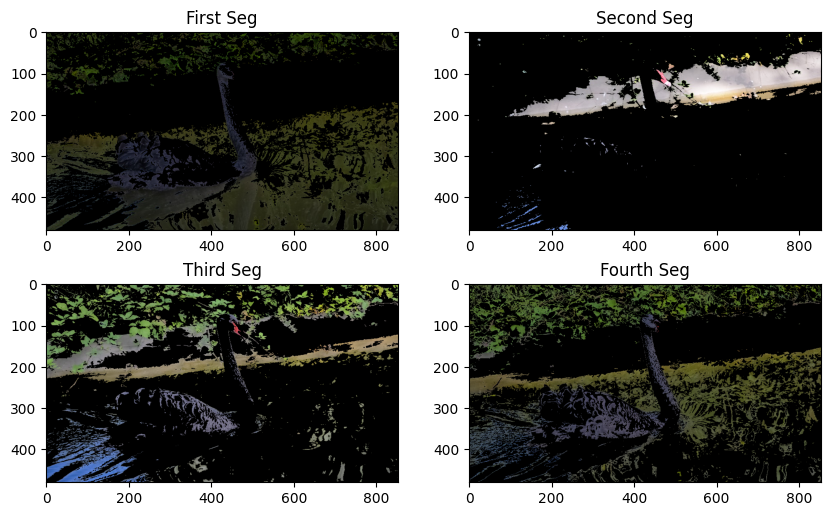

In [22]:
results = []
K=4

img = testing_seq[0]
label = kmeans(K, img)
out = color.label2rgb(label, img, bg_label=0)
segs = []
for i in range(K):
    seg = img.copy()
    seg[label!=i]=0
    segs.append(seg)


fig, axs = plt.subplots(2, 2, figsize=(10, 6))

axs[0, 0].imshow(segs[0])
axs[0, 0].set_title('First Seg')
axs[0, 1].imshow(segs[1])
axs[0, 1].set_title('Second Seg')
axs[1, 0].imshow(segs[2])
axs[1, 0].set_title('Third Seg')
axs[1, 1].imshow(segs[3])
axs[1 ,1].set_title('Fourth Seg')

plt.show()

To obtain the segmentation of the complete testing sequence, run the following cell:

In [23]:
results = []
for i, img in tqdm(enumerate(testing_seq),desc='k-mean segmentation on RGB values'):
    label = kmeans(4, img)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()

k-mean segmentation on RGB values: 0it [00:00, ?it/s]/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
k-mean segmentation on RGB values: 3it [00:00, 20.72it/s]/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarni

Using only RGB values for segmentation cannot achieve the desired results. 
It can be observed that the movement of the swan is distinguishable from the background, so we use motion or displacement as features for segmentation.

**TASK 1.1: Complete `calcOpticalFlowHS()` in `lab4.py`. Run following code and tweak suitable smoothing parameter `lambda` and threshold `delta`.**

In [24]:
%%time
flows = []
vis = []

for i in tqdm(range(len(testing_seq)-1), desc='compute optical flow'):
    prvs = testing_seq[i]
    hsv = np.zeros_like(prvs)
    prvs = cv2.cvtColor(prvs, cv2.COLOR_BGR2GRAY)
    next = testing_seq[i+1]
    next = cv2.cvtColor(next, cv2.COLOR_BGR2GRAY)
    hsv[..., 1] = 255
    flow = calcOpticalFlowHS(prvs, next, param_lambda = 5, param_delta = 0.15)
    mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    hsv[..., 0] = ang*180/np.pi/2
    hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)
    
    flows.append(flow) 
    vis.append(cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB))

ani = animated_frames(vis)
display(HTML(ani.to_html5_video()))
plt.close()

compute optical flow:  11%|█         | 1/9 [00:03<00:27,  3.43s/it]

converged


compute optical flow:  22%|██▏       | 2/9 [00:06<00:24,  3.51s/it]

converged


compute optical flow:  33%|███▎      | 3/9 [00:10<00:21,  3.62s/it]

converged


compute optical flow:  44%|████▍     | 4/9 [00:14<00:18,  3.72s/it]

converged


compute optical flow:  56%|█████▌    | 5/9 [00:18<00:15,  3.78s/it]

converged


compute optical flow:  67%|██████▋   | 6/9 [00:22<00:11,  3.77s/it]

converged


compute optical flow:  78%|███████▊  | 7/9 [00:25<00:07,  3.74s/it]

converged


compute optical flow:  89%|████████▉ | 8/9 [00:29<00:03,  3.74s/it]

converged


compute optical flow: 100%|██████████| 9/9 [00:33<00:00,  3.72s/it]

converged


CPU times: user 31.7 s, sys: 1.97 s, total: 33.7 s
Wall time: 33.9 s


Run K-means on HornSchunck optical flow for the first frame. 
You will see the main object is well segmented. However, the background is noisy. 

/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


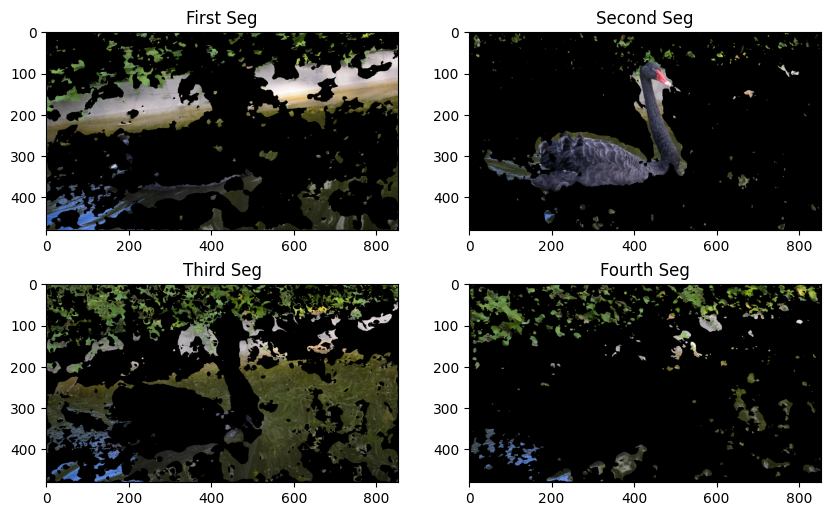

CPU times: user 2.35 s, sys: 833 ms, total: 3.18 s
Wall time: 730 ms


In [25]:
%%time
results = []
K=4

img = testing_seq[0]
label = kmeans(K, flows[0])
out = color.label2rgb(label, img, bg_label=0)
segs = []
for i in range(K):
    seg = img.copy()
    seg[label!=i]=0
    segs.append(seg)

fig, axs = plt.subplots(2, 2, figsize=(10, 6))

axs[0, 0].imshow(segs[0])
axs[0, 0].set_title('First Seg')
axs[0, 1].imshow(segs[1])
axs[0, 1].set_title('Second Seg')
axs[1, 0].imshow(segs[2])
axs[1, 0].set_title('Third Seg')
axs[1, 1].imshow(segs[3])
axs[1 ,1].set_title('Fourth Seg')

plt.show()

Run the following cell to get the segmentation of the complete testing sequence.

In [26]:
results = []
for i, flow in tqdm(enumerate(flows),desc='k-mean segmentation on flow feature'):
    label = kmeans(4, flow)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()


k-mean segmentation on flow feature: 0it [00:00, ?it/s]/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
k-mean segmentation on flow feature: 1it [00:00,  7.05it/s]/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureW

We then combine the appearance and motion evidence: concatenate the RGB values and optical flow to form the aggregated feature, and consider reweighting features for better results. 

**TASK 1.2: Complete `combine_and_normalize_features()` in `lab4.py`. Run following code and tweak suitable weighting parameter `gamma`.**

In [27]:
results = []
gamma = 5
for i, flow in tqdm(enumerate(flows),desc='k-mean segmentation on RGB feature'):
    feats = combine_and_normalize_features(feat1=testing_seq[i], feat2=flow, gamma=gamma)
    label = kmeans(4, feats)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()

k-mean segmentation on RGB feature: 0it [00:00, ?it/s]/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
k-mean segmentation on RGB feature: 1it [00:00,  2.98it/s]/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
k-mean segmentation on RGB feature: 3it [00:00,  7.87it/s]/Users/chownces/.pyenv/versions/3.8.10/lib/python3

- **How do the parameters `lambda` and `delta` affect the optical flow results?**
  - When lambda is small, we only care more about enforcing a smooth flow field during the update equations (as explained in lecture 10 slides 30 and 34). As a result, a smaller lambda gives rise to less distinct edges of the swan when visualizing the optical flow output.
  - When delta is too big, we 'reach' convergence and terminate the updates earlier, resulting in the flow fields not being learnt as accurately as it could be. In our case, below delta=0.15, the output does not change much since convergence has already been reached.


- **How does the weighting parameter `gamma` affect the final segmentation results?**
  - With a higher gamma, we give more weight to F2, which is the flow field. As a result the segmentation output looks more similar to the one in task 1.1 than the segmentation output using RGB values only (at the start of the report). Thus, the marked segment boundaries using a higher gamma are bigger and more 'chunky' as compared to the results with a smaller gamma.

After adding appearance information, the white wall was effectively segmented, but the complex leaves were not. In the next section, we will use textons as features for segmentation.

## Section 2: Textons

The image is convolved with a 17-dimensional filter-bank at scale κ. The filter-bank consists of Gaussians at scales κ, 2κ and 4κ, x and y derivatives of Gaussians at scales 2κ and 4κ, and Laplacians of Gaussians at scales κ, 2κ, 4κ and 8κ.
Run following code to visualize them.


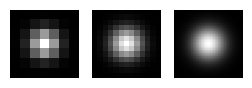

In [28]:
# Gaussians at scales κ, 2κ and 4κ

kappa = 1
kernels = {}

kernels['gaussian']=[]
fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(3,1))  

for i, sigma in enumerate([kappa, 2*kappa, 4*kappa]):
    kg = build_gaussian_kernel(sigma=sigma)
    kernels['gaussian'].append(kg)
    ax[i].imshow(kg, cmap = 'gray')
    ax[i].axis("off")
    
plt.show()


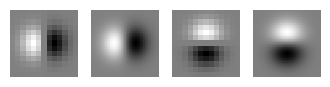

In [29]:
# x and y derivatives of Gaussians at scales 2κ and 4κ

kernels['gaussian_derivative']=[]
ydg2, xdg2 = build_gaussian_derivative_kernel(sigma=2*kappa)
ydg4, xdg4 = build_gaussian_derivative_kernel(sigma=4*kappa)

fig, ax = plt.subplots(ncols=4, nrows=1, figsize=(4,1))  
ax[0].imshow(xdg2, cmap = 'gray')
ax[0].axis("off")
ax[1].imshow(xdg4, cmap = 'gray')
ax[1].axis("off")
ax[2].imshow(ydg2, cmap = 'gray')
ax[2].axis("off")
ax[3].imshow(ydg4, cmap = 'gray')
ax[3].axis("off")
plt.show()

kernels['gaussian_derivative'] = [ydg2, ydg4, xdg2, xdg4]

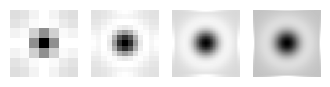

In [30]:
# Laplace of Gaussians at scales κ, 2κ and 4κ, 8k

kernels['LoG']=[]
fig, ax = plt.subplots(ncols=4, nrows=1, figsize=(4,1))  
for i, sigma in enumerate([kappa, 2*kappa, 4*kappa, 8*kappa]):
    klg = build_LoG_kernel(sigma=sigma)
    ax[i].imshow(klg, cmap = 'gray')
    ax[i].axis("off")
    kernels['LoG'].append(klg)

plt.show()


After buiding the filter bank, run following code to load training image,  The Microsoft Research Cambridge (MSRC) database2 is composed of 591 photographs of the following 21 object classes: building, grass, tree, cow, sheep, sky, airplane, water, face, car, bicycle, flower, sign, bird, book, chair, road, cat, dog, body, and boat. Examples are shown below:

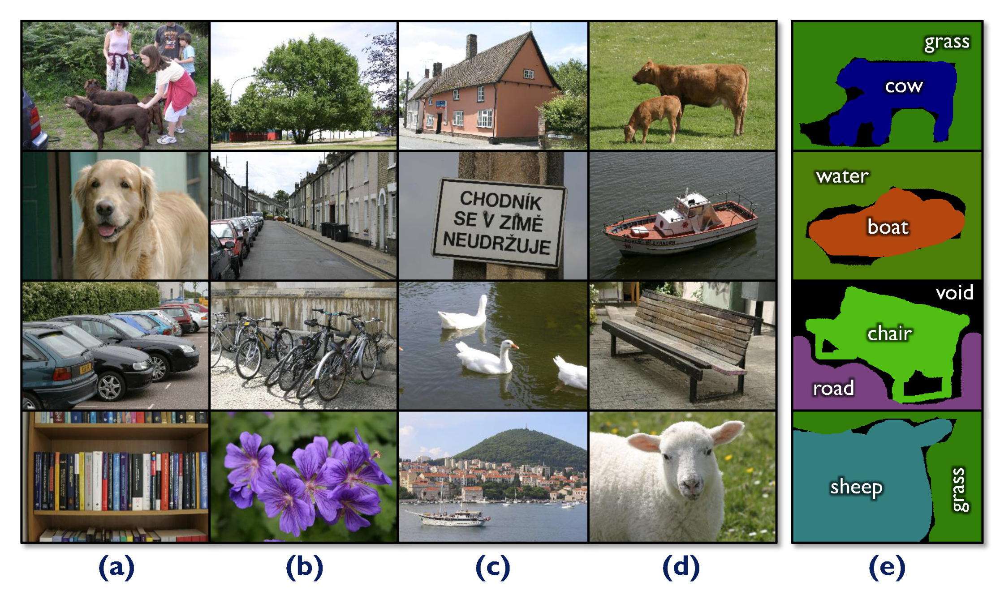

In [31]:
with open('Train.txt') as f:
    frames = f.read().splitlines()
training_imgs = [cv2.cvtColor(cv2.imread(os.path.join('MSRC_v2', frame)), cv2.COLOR_BGR2RGB) for frame in frames]
print(len(training_imgs))

276


**TASK 2.1: Complete `features_from_filter_bank()` in `lab4.py`.**

Run following code to visualize the filter response for the first training image.


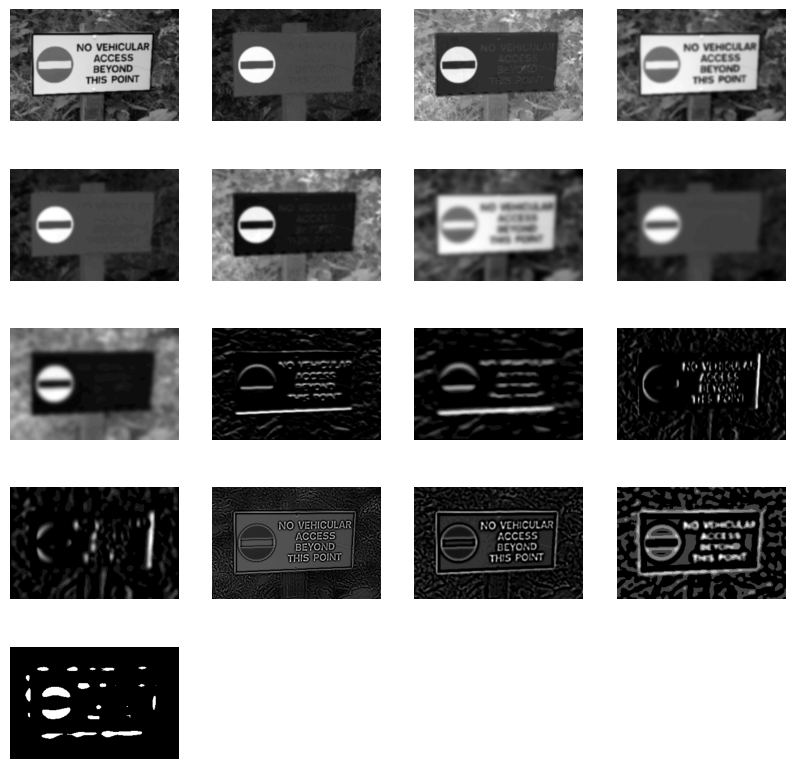

CPU times: user 509 ms, sys: 7.42 ms, total: 517 ms
Wall time: 281 ms


In [32]:
%%time

fig, ax = plt.subplots(ncols=4, nrows=5, figsize=(10,10))

c = features_from_filter_bank(training_imgs[0], kernels)

for i in range(20): 
    if i<17:
        ax[i//4, i%4].imshow(c[:,:,i], cmap = 'gray')
    ax[i//4, i%4].axis("off")
plt.show()

Next, you will learn the textons by clustering the training data (The Microsoft Research Cambridge (MSRC) database2) using the K-mean algorithm. 

**TASK 2.2: Implement `Textonization()` class in `lab4.py`.**

In [33]:
%%time
results = []

textonization = Textonization(kernels, n_clusters=250)
textonization.training(training_imgs)
gamma = 5
textures = []
for i, img in tqdm(enumerate(testing_seq),desc='k-mean segmentation on textons'):
    feats = textonization.testing(img)
    textures.append(feats)
    label = kmeans(4, feats)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()

/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
k-mean segmentation on textons: 0it [00:00, ?it/s]/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
k-mean segmentation on textons: 1it [00:00,  1.56it/s]/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
k-mean segmentation on textons: 2it [00:01,  1.57it/s]/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packa

CPU times: user 1min 9s, sys: 13.9 s, total: 1min 23s
Wall time: 28.8 s


**TASK 2.3: Complete `histogram_per_pixel()` in `lab4.py`.**

In [34]:

%%time
results = []
histogram_feat=[]
gamma = 5
for i, img in tqdm(enumerate(testing_seq),desc='k-mean segmentation on textons'):
    texture = textures[i]
    feats = histogram_per_pixel(texture, window_size=49)
    histogram_feat.append(feats)
    label = kmeans(4, feats)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()




k-mean segmentation on textons: 0it [00:00, ?it/s]/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
k-mean segmentation on textons: 1it [00:03,  3.45s/it]/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
k-mean segmentation on textons: 2it [00:06,  3.30s/it]/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
k-mean segmentation on textons: 3it [00:09,  3.29s/it]/Users/c

CPU times: user 57.7 s, sys: 5.85 s, total: 1min 3s
Wall time: 35.4 s


- **How does the window size of the texton histogram impact the final results?** 

The larger the window size, the larger the size of the segments found in general. The segments found are also less fragmented and are more likely to represent texture boundaries of larger regions. This is because the larger the window size, more neighbouring pixels with similar textures (which means similar feature vectors and texton histograms) would be in the window. Thus, the K-Means algorithm would group these similar pixels together, resulting in a larger segment being found.

On the other hand, a smaller window size means the size of the segments found are smaller, which means the segments are more likely to represent texture boundaries of smaller regions. This is because differences in a smaller area will be better captured with a smaller window.

- **Compared to segmentation based only on texton ID, what are the advantages and disadvantages? Please explain your reasoning. Hint: analyze the boundary.**

The first advantage is that the segments found using texton histogram are less fragmented and are more likely to represent actual texture boundaries. This is because segmentation based on texton ID considers only a single pixel and does not account for neighbouring pixels, whereas segmentation based on texton histogram accounts for neighbouring pixels within a window. Hence, using texton histograms helps to aggregate and smoothen out the differences between adjacent pixels.

The second advantage is that there is more flexibility when segmenting based on texton histograms. By adjusting the window size of the texton histogram, segments at different scales can be captured, as elaborated in the answer to the previous question.

The disadvantage is that only regions in a certain scale can be captured at one time due to the fixed window size. Segmentation based only on texton ID would allow regions in different scales to be captured simultaneously because it groups pixels with similar texton IDs regardless of how near or far apart they are.

## Section 3: Segmentations with Optical Flow and Textons

In the final step, you need to combine the optical flow feature from Part 1 with the texture features obtained from Part 2.

**TASK 3.1: Adjust `gamma` for better results.**

In [35]:
results = []
gamma = 4
for i, flow in tqdm(enumerate(flows),desc='k-mean segmentation on RGB feature'):
    feats = combine_and_normalize_features(feat1=histogram_feat[i], feat2=flow, gamma=gamma)
    label = kmeans(4, feats)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()

k-mean segmentation on RGB feature: 0it [00:00, ?it/s]/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
k-mean segmentation on RGB feature: 1it [00:03,  3.60s/it]/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
k-mean segmentation on RGB feature: 2it [00:06,  3.26s/it]/Users/chownces/.pyenv/versions/3.8.10/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
k-mean segmentation on RGB feature: 3it [00:09,  3